In [90]:
import pandas as pd
pd.set_option('display.max_colwidth', 200000)
import matplotlib.pyplot as plt
import numpy as np
from wordcloud import WordCloud,STOPWORDS
import nltk
from scipy.stats import poisson
from nltk.corpus import stopwords
import text2emotion as te
from scipy.stats import norm
import scipy.stats
from scipy.stats import bernoulli
from scipy.stats.distributions import norm, gamma
import string
import seaborn as sns
from string import punctuation
from nltk.tokenize import word_tokenize
from collections import Counter
from nltk.sentiment.vader import SentimentIntensityAnalyzer

nltk.download('stopwords')
nltk.download('vader_lexicon')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\sirip\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\sirip\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

Cleaning the text and reading the lines

In [2]:
with open("t8.shakespeare_orig.txt") as file:
    lines = []
    for line in file:
        if (line.strip()!=""):
            line=line.strip()
            lines.append(line)

In [3]:
len(lines)

114840

### Extracting Sonnets

Sonnets begin with a number and are a fixed number of lines after that. (14 lines)


In [4]:
sonnets = []
sonnet_idxs = [str(i) for i in range(1, 155)]
for l in lines:
    if l in sonnet_idxs:
        sonnets.append(lines[lines.index(l)+1:lines.index(l)+15])
         
sonnets = ['||'.join(sonnets[i]) for i in range(len(sonnets))]
len(sonnets)

154

In [5]:
df = pd.DataFrame(sonnets, columns=['text'])
df['genre'] = 'sonnet'
df

,text,genre
0,"From fairest creatures we desire increase,||That thereby beauty's rose might never die,||But as the riper should by time decease,||His tender heir might bear his memory:||But thou contracted to thine own bright eyes,||Feed'st thy light's flame with self-substantial fuel,||Making a famine where abundance lies,||Thy self thy foe, to thy sweet self too cruel:||Thou that art now the world's fresh ornament,||And only herald to the gaudy spring,||Within thine own bud buriest thy content,||And tender churl mak'st waste in niggarding:||Pity the world, or else this glutton be,||To eat the world's due, by the grave and thee.",sonnet
1,"When forty winters shall besiege thy brow,||And dig deep trenches in thy beauty's field,||Thy youth's proud livery so gazed on now,||Will be a tattered weed of small worth held:||Then being asked, where all thy beauty lies,||Where all the treasure of thy lusty days;||To say within thine own deep sunken eyes,||Were an all-eating shame, and thriftless praise.||How much more praise deserved thy beauty's use,||If thou couldst answer 'This fair child of mine||Shall sum my count, and make my old excuse'||Proving his beauty by succession thine.||This were to be new made when thou art old,||And see thy blood warm when thou feel'st it cold.",sonnet
2,"Look in thy glass and tell the face thou viewest,||Now is the time that face should form another,||Whose fresh repair if now thou not renewest,||Thou dost beguile the world, unbless some mother.||For where is she so fair whose uneared womb||Disdains the tillage of thy husbandry?||Or who is he so fond will be the tomb,||Of his self-love to stop posterity?||Thou art thy mother's glass and she in thee||Calls back the lovely April of her prime,||So thou through windows of thine age shalt see,||Despite of wrinkles this thy golden time.||But if thou live remembered not to be,||Die single and thine image dies with thee.",sonnet
3,"Unthrifty loveliness why dost thou spend,||Upon thy self thy beauty's legacy?||Nature's bequest gives nothing but doth lend,||And being frank she lends to those are free:||Then beauteous niggard why dost thou abuse,||The bounteous largess given thee to give?||Profitless usurer why dost thou use||So great a sum of sums yet canst not live?||For having traffic with thy self alone,||Thou of thy self thy sweet self dost deceive,||Then how when nature calls thee to be gone,||What acceptable audit canst thou leave?||Thy unused beauty must be tombed with thee,||Which used lives th' executor to be.",sonnet
4,"Those hours that with gentle work did frame||The lovely gaze where every eye doth dwell||Will play the tyrants to the very same,||And that unfair which fairly doth excel:||For never-resting time leads summer on||To hideous winter and confounds him there,||Sap checked with frost and lusty leaves quite gone,||Beauty o'er-snowed and bareness every where:||Then were not summer's distillation left||A liquid prisoner pent in walls of glass,||Beauty's effect with beauty were bereft,||Nor it nor no remembrance what it was.||But flowers distilled though they with winter meet,||Leese but their show, their substance still lives sweet.",sonnet
...,...,...
149,"O from what power hast thou this powerful might,||With insufficiency my heart to sway,||To make me give the lie to my true sight,||And swear that brightness doth not grace the day?||Whence hast thou this becoming of things ill,||That in the very refuse of thy deeds,||There is such strength and warrantise of skill,||That in my mind thy worst all best exceeds?||Who taught thee how to make me love thee more,||The more I hear and see just cause of hate?||O though I love what others do abhor,||With others thou shouldst not abhor my state.||If thy unworthiness raised love in me,||More worthy I to be beloved of thee.",sonnet
150,"Love is too young to know what conscience is,||Yet who knows not conscience is born of love?||Then gentle cheater urge not my amiss,||Lest guilty of my faults thy sweet sel

#### After analysis, a missing sonet is found which is appended from the text file to this data frame.

In [6]:
lines = []
with open('missing_sonet.txt', 'r') as f:
    for line in f:
        line = line.strip()
        lines.append(line)
lines = ['||'.join(lines)]

In [7]:
df2 = pd.DataFrame(lines, columns=['text'])
df2['genre'] = 'sonnet'
df = df.append(df2, ignore_index=True)

### The Comedies

In [8]:
comedies = []
cleaned_comedies = []
count = 0
match = []

with open('TheComedies.txt', 'r') as file:
    for line in file:
        if (line.strip()!=""):
            line = line.strip()
            comedies.append(line)
            
for l in comedies:
    count +=1
    if 'by William Shakespeare' in l:
        match.append(count)

match.append(count)

cleaned_comedies = ['||'.join(comedies[match[i]:match[i+1]-3]) for i in range(len(match)-1)]

In [9]:
df_comedies = pd.DataFrame(cleaned_comedies, columns=['text'])
df_comedies['genre'] = 'comedy'

df = df.append(df_comedies, ignore_index=True)

df

text  \
0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       

### The Tragedies

In [10]:
tragedies = []
cleaned_tragedies = []
count = 0
match = []

with open('TheTragedies.txt', 'r') as file:
    for line in file:
        if (line.strip()!=""):
            line = line.strip()
            tragedies.append(line)
            
for l in tragedies:
    count +=1
    if 'by William Shakespeare' in l:
        match.append(count)

match.append(count)

cleaned_tragedies = ['||'.join(tragedies[match[i]:match[i+1]-3]) for i in range(len(match)-1)]

In [11]:
df_tragedies = pd.DataFrame(cleaned_tragedies, columns=['text'])
df_tragedies['genre'] = 'tragedy'

df = df.append(df_tragedies, ignore_index=True)

df

text  \
0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       

### The Histories

In [12]:
histories = []
cleaned_histories = []
count = 0
match = []

with open('TheHistories.txt', 'r') as file:
    for line in file:
        if (line.strip()!=""):
            line = line.strip()
            histories.append(line)
            
for l in histories:
    count +=1
    if 'by William Shakespeare' in l:
        match.append(count)

match.append(count)

cleaned_histories = ['||'.join(histories[match[i]:match[i+1]-3]) for i in range(len(match)-1)]

In [13]:
df_histories = pd.DataFrame(cleaned_histories, columns=['text'])
df_histories['genre'] = 'history'

df = df.append(df_histories, ignore_index=True)

df

text  \
0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       

# Part1

In [14]:
#Read text 
text = open('t8.shakespeare.txt',mode='r',encoding='utf-8').read()

our_stop_words = []
with open('stopwords.txt', 'r') as file:
    words = file.readlines()
    for word in words:
        our_stop_words.append(word.strip())

stpwrd = nltk.corpus.stopwords.words('english')
stpwrd.extend(our_stop_words)

wc = WordCloud(background_color="black", stopwords=stpwrd, height=600, width=400)
wc.generate(text)

# store to file
wc.to_file("wordcloud_output.png")


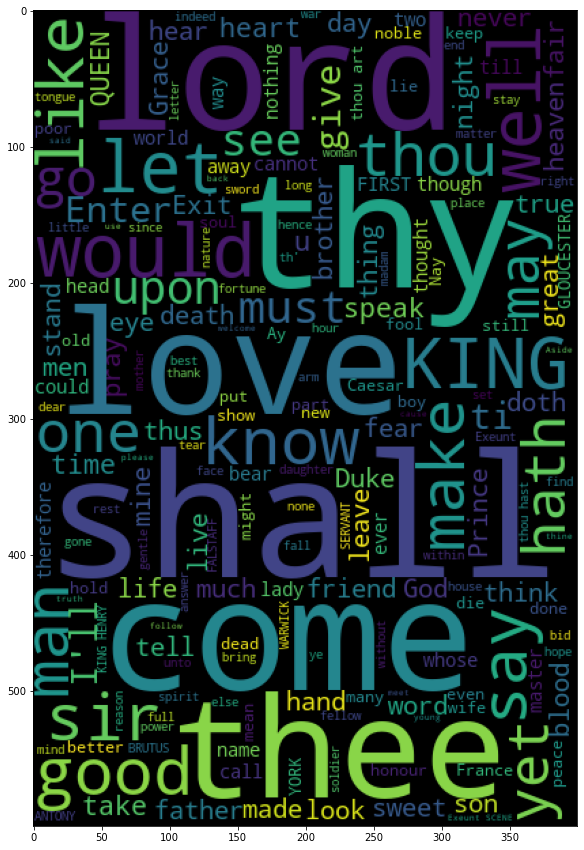

In [15]:
plt.figure(figsize=(30,15))
plt.imshow(wc)

### What's the average number of words per sentence?

### lets iterate over the entire dataframe text column to the the sentences and average number of sentences


To get around the problems in sentence tokenization, I have used '||' as the delimiter which gives us more control and accuracy when tokenizing sentences.  

In [16]:
def count_lines(text):
    lines = []
    lns = text.split('||')
    lines.extend(lns)
    return len(lines)

def count_words(text):
    lines = []
    words_per_line = []
    lns = text.split('||')
    lines.extend(lns)
    for line in lines:
        words = line.split()
        words_per_line.append(len(words)) 
    return words_per_line

#### For the total dataframe

In [17]:
lines_per_row = [count_lines(df['text'][i]) for i in df.index]
print('number of lines:', sum(lines_per_row))

words_per_lines = [count_words(df['text'][i]) for i in df.index]
words_per_lines = sum(words_per_lines, [])
print('average words per sentence:', np.mean(words_per_lines))

number of lines: 112623
average words per sentence: 7.83829235591309


#### For Sonnets

#### for poems, let's consider each line to be a separate sentence

In [18]:
lines_per_row = [count_lines(df[df['genre']=='sonnet']['text'][i]) for i in df[df['genre']=='sonnet'].index]
print('number of sonnet lines:', sum(lines_per_row))

words_per_lines = [count_words(df[df['genre']=='sonnet']['text'][i]) for i in df[df['genre']=='sonnet'].index]
words_per_lines = sum(words_per_lines, [])
print('average words per sentence of sonnets:', np.mean(words_per_lines))

number of sonnet lines: 2485
average words per sentence of sonnets: 8.10543259557344


#### For Comedies

In [19]:
lines_per_row = [count_lines(df[df['genre']=='comedy']['text'][i]) for i in df[df['genre']=='comedy'].index]
print('number of comedy lines:', sum(lines_per_row))

words_per_lines = [count_words(df[df['genre']=='comedy']['text'][i]) for i in df[df['genre']=='comedy'].index]
words_per_lines = sum(words_per_lines, [])
print('average words per sentence of comedies:', np.mean(words_per_lines))

number of comedy lines: 36951
average words per sentence of comedies: 8.099483099239533


#### For Histories

In [20]:
lines_per_row = [count_lines(df[df['genre']=='history']['text'][i]) for i in df[df['genre']=='history'].index]
print('number of history lines:', sum(lines_per_row))

words_per_lines = [count_words(df[df['genre']=='history']['text'][i]) for i in df[df['genre']=='history'].index]
words_per_lines = sum(words_per_lines, [])
print('average words per sentence of history:', np.mean(words_per_lines))

number of history lines: 32615
average words per sentence of history: 7.909918749041852


####  For Tragedy

In [21]:
lines_per_row = [count_lines(df[df['genre']=='tragedy']['text'][i]) for i in df[df['genre']=='tragedy'].index]
print('number of tragedy lines:', sum(lines_per_row))

words_per_lines = [count_words(df[df['genre']=='tragedy']['text'][i]) for i in df[df['genre']=='tragedy'].index]
words_per_lines = sum(words_per_lines, [])
print('average words per sentence of tragedy:', np.mean(words_per_lines))

number of tragedy lines: 40572
average words per sentence of tragedy: 7.526471458148476


# Part2

- What's the probability that Shakespeare asks a question?
- What's the distribution of the number of questions for all his works? 
- What's the distribution of the number of questions based on genre (comedies, tragedies, histories, sonnets)? 
- What well known probability distributions could you match each one with? 


In [73]:
def get_ques_count(text):
    counts = Counter(text)
    terminals="?"
    Question_counts = [v for k, v in counts.items() if k in terminals]
    if not Question_counts:
        return 0
    return Question_counts[0]

df['no_of_ques'] = df['text'].apply(lambda x: get_ques_count(x))

What's the probability that Shakespeare asks a question?

In [75]:
lines_per_row = [count_lines(df['text'][i]) for i in df.index]
num_lines = sum(lines_per_row)

total_ques = df['no_of_ques'].sum(axis=0)
print('probability of question', total_ques/num_lines)

probability of question 0.0930094208110244


What's the distribution of the number of questions for all his works?

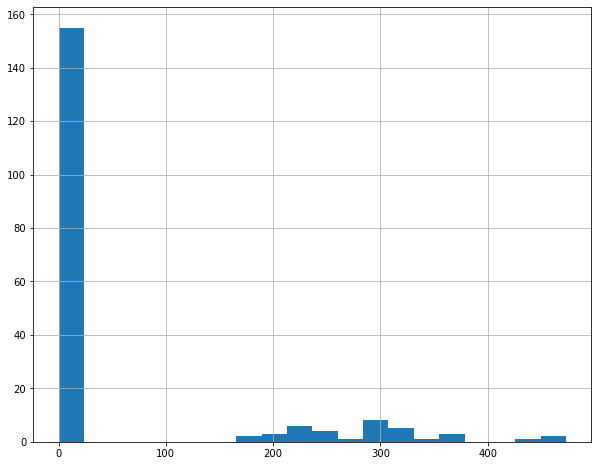

In [79]:
df['no_of_ques'].hist(bins=20, figsize=(10,8))
plt.show()

What's the distribution of the number of questions based on genre (comedies, tragedies, histories, sonnets)?

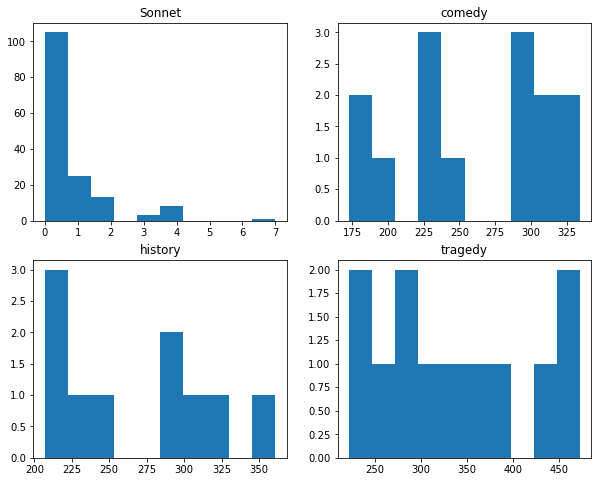

In [86]:
fig, axs = plt.subplots(2, 2, figsize=(10,8))


axs[0, 0].hist(df[df['genre']=='sonnet']['no_of_ques'])
axs[0, 0].set_title('Sonnet')

axs[0, 1].hist(df[df['genre']=='comedy']['no_of_ques'])
axs[0, 1].set_title('comedy')

axs[1, 0].hist(df[df['genre']=='history']['no_of_ques'])
axs[1, 0].set_title('history')

axs[1, 1].hist(df[df['genre']=='tragedy']['no_of_ques'])
axs[1, 1].set_title('tragedy')

plt.show()

#### What well known probability distributions could you match each one with?

We could fit a poisson distribution as the questions are counts and the Poisson distribution is a discrete probability distribution that expresses the probability of a given number of events.

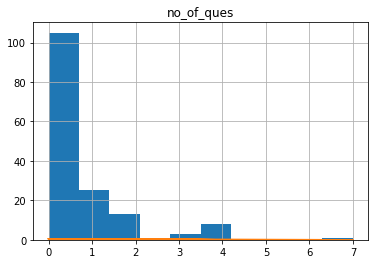

In [95]:

#df[df['genre']=='sonnet']['no_of_ques'].hist()
df_sonnet_ques = df[df['genre']=='sonnet'][['no_of_ques']]
lam1 = df_sonnet_ques.mean()
df_sonnet_ques.hist(bins =10)

plt.plot(df_sonnet_ques, poisson.pmf(df_sonnet_ques, lam1))

plt.show()

# Part3

## Sentiment analysis

In [23]:
def sentimentanalysis(txt):
    return SentimentIntensityAnalyzer().polarity_scores(txt)

def get_sentiment_row(text):
    clean_words=[]
    
    text=text.replace("||","\n")
    text=text.lower()
    text=text.replace("\n"," ")
    text=text.translate(str.maketrans("","",string.punctuation))
    tokenize_words=word_tokenize(text)

    ### stpwrd already contains stop words from nltk, stopwords.txt

    for i in tokenize_words:
        if i not in stpwrd:
            clean_words.append(i)

    clean_text = ' '.join(clean_words)
    sentiments=sentimentanalysis(clean_text)
   
    return sentiments

df_copy = df.copy()
df_copy['sentiments'] = df_copy['text'].apply(lambda x: get_sentiment_row(x))


Now that we got the sentiments in the dictionary format, let's make them into individual columns

In [24]:
def populate_columns(dictionary):
    neg = dictionary['neg']
    neu = dictionary['neu']
    pos = dictionary['pos']
    compound = dictionary['compound']
    
    return (neg, neu, pos, compound)


df_copy['neg'] = df_copy['sentiments'].apply(lambda x: populate_columns(x)[0])
df_copy['neu'] = df_copy['sentiments'].apply(lambda x: populate_columns(x)[1])
df_copy['pos'] = df_copy['sentiments'].apply(lambda x: populate_columns(x)[2]) 
df_copy['compound'] = df_copy['sentiments'].apply(lambda x: populate_columns(x)[3]) 
df_copy

text  \
0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       

## Sentiment distribution per genre

### For Sonnets

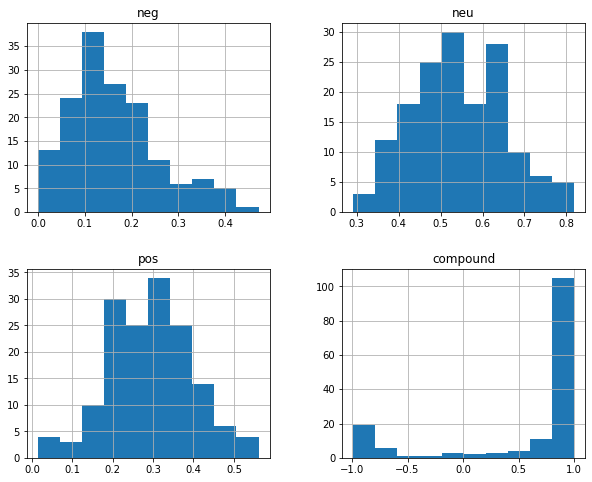

In [25]:
df_sonnet_dist = df_copy[df_copy['genre']=='sonnet'][['neg', 'neu', 'pos', 'compound']]
df_sonnet_dist.hist(figsize=(10,8))
plt.show()

### Fitting distributions on Sonnets

From the distributions we can see that the postive, neutral sentiment closely follow a gaussian distribution. The negative sentiment closely follows a gamma distribution. 

#### The compound sentiment closely follows a bernoulli distribution.

Neutral model parameters (norm):  (0.543625806451613, 0.10940915503281613)
Positive model parameters (norm):  (0.2929225806451613, 0.1018807991333497)
Negative model parameters (gamma):  (4.493740091434342, -0.04034269349482045, 0.04535356657730831)


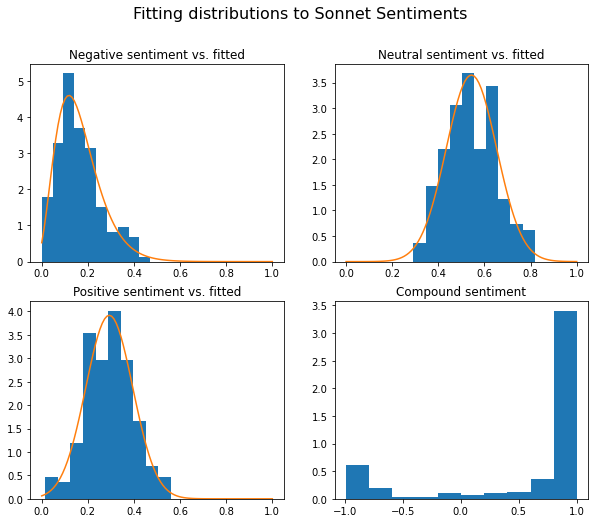

In [26]:
sonnet_neu = df_sonnet_dist['neu']
sonnet_pos = df_sonnet_dist['pos']
sonnet_neg = df_sonnet_dist['neg']
sonnet_compound = df_sonnet_dist['compound']



### Normal for Neutral and Positive

sonnet_params_neu = norm.fit(sonnet_neu)
print("Neutral model parameters (norm): ", sonnet_params_neu)
sonnet_model_neu = norm(*sonnet_params_neu)

sonnet_params_pos = norm.fit(sonnet_pos)
print("Positive model parameters (norm): ", sonnet_params_pos)
sonnet_model_pos = norm(*sonnet_params_pos)


### Gamma for negative

sonnet_params_neg = gamma.fit(sonnet_neg)
print("Negative model parameters (gamma): ", sonnet_params_neg)
sonnet_model_neg = gamma(*sonnet_params_neg)

# plot the samples and the model to compare

fig, axs = plt.subplots(2, 2, figsize=(10,8))
fig.suptitle("Fitting distributions to Sonnet Sentiments", fontsize=16)

axs[0, 0].hist(sonnet_neg, density=True)
axs[0, 0].plot(np.linspace(0, 1, 100), sonnet_model_neg.pdf(np.linspace(0, 1, 100)))
axs[0, 0].set_title('Negative sentiment vs. fitted')


axs[0, 1].hist(sonnet_neu, density=True)
axs[0, 1].plot(np.linspace(0, 1, 100), sonnet_model_neu.pdf(np.linspace(0, 1, 100)))
axs[0, 1].set_title('Neutral sentiment vs. fitted')


axs[1, 0].hist(sonnet_pos, density=True)
axs[1, 0].plot(np.linspace(0, 1, 100), sonnet_model_pos.pdf(np.linspace(0, 1, 100)))
axs[1, 0].set_title('Positive sentiment vs. fitted')


axs[1, 1].hist(sonnet_compound, density=True)
axs[1, 1].set_title('Compound sentiment')


plt.show()

### For Comedy

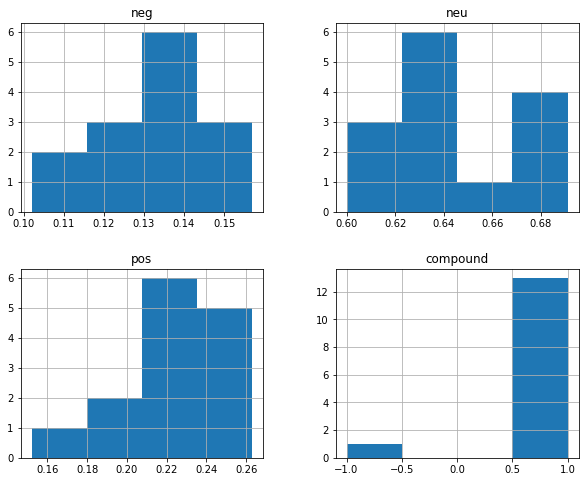

In [27]:
df_comedy_dist = df_copy[df_copy['genre']=='comedy'][['neg', 'neu', 'pos', 'compound']]
df_comedy_dist.hist(bins=4, figsize=(10,8))
plt.show()

### Fitting distributions on Comedies

TODO write the matching dist here

#### The compound sentiment closely follows a bernoulli distribution.

Negative model parameters (gamma):  (340.15713978187955, -0.1430035350787353, 0.0008098642495180477)
Neutral model parameters (gamma):  (5.024962099692565, 0.5823411473994458, 0.01192936121653183)
Positive model parameters (norm):  (0.22507142857142862, 0.029373127382777923)


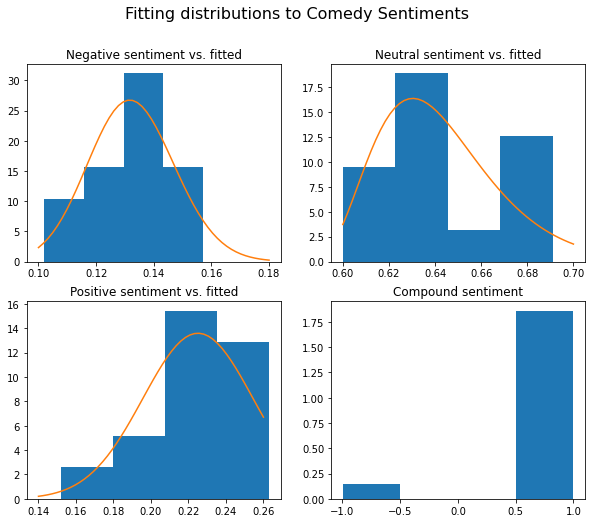

In [42]:
comedy_neu = df_comedy_dist['neu']
comedy_pos = df_comedy_dist['pos']
comedy_neg = df_comedy_dist['neg']
comedy_compound = df_comedy_dist['compound']

comedy_params_neg = gamma.fit(comedy_neg)
print("Negative model parameters (gamma): ", comedy_params_neg)
comedy_model_neg = gamma(*comedy_params_neg)

comedy_params_neu = gamma.fit(comedy_neu)
print("Neutral model parameters (gamma): ", comedy_params_neu)
comedy_model_neu = gamma(*comedy_params_neu)

comedy_params_pos = norm.fit(comedy_pos)
print("Positive model parameters (norm): ", comedy_params_pos)
comedy_model_pos = norm(*comedy_params_pos)





# plot the samples and the model to compare

fig, axs = plt.subplots(2, 2, figsize=(10,8))
fig.suptitle("Fitting distributions to Comedy Sentiments", fontsize=16)

axs[0, 0].hist(comedy_neg, bins=4, density=True)
axs[0, 0].plot(np.linspace(0.1, 0.18), comedy_model_neg.pdf(np.linspace(0.1, 0.18)))
axs[0, 0].set_title('Negative sentiment vs. fitted')


axs[0, 1].hist(comedy_neu, bins=4, density=True)
axs[0, 1].plot(np.linspace(0.6, 0.7), comedy_model_neu.pdf(np.linspace(0.6, 0.7)))
axs[0, 1].set_title('Neutral sentiment vs. fitted')

axs[1, 0].hist(comedy_pos, bins=4, density=True)
axs[1, 0].plot(np.linspace(0.14, 0.26), comedy_model_pos.pdf(np.linspace(0.14, 0.26)))
axs[1, 0].set_title('Positive sentiment vs. fitted')

axs[1, 1].hist(comedy_compound, bins=4, density=True)
axs[1, 1].set_title('Compound sentiment')


plt.show()

### For Tragedy

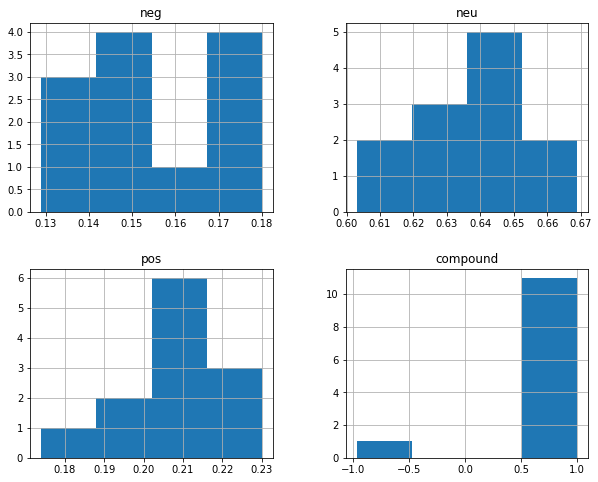

In [43]:
df_tragedy_dist = df_copy[df_copy['genre']=='tragedy'][['neg', 'neu', 'pos', 'compound']]
df_tragedy_dist.hist(bins=4, figsize=(10,8))
plt.show()

### Fitting distributions on Tragedies

TODO write the matching dist here

#### The compound sentiment closely follows a bernoulli distribution.

Negative model parameters (gamma):  (610.4667211699243, -0.24358123563107825, 0.0006535302990288694)
Neutral model parameters (gamma):  (391.72062436441433, 0.27762770770522205, 0.0009200338196550979)
Positive model parameters (gamma):  (311.87615198315325, -0.06440090196797893, 0.0008680839172900885)


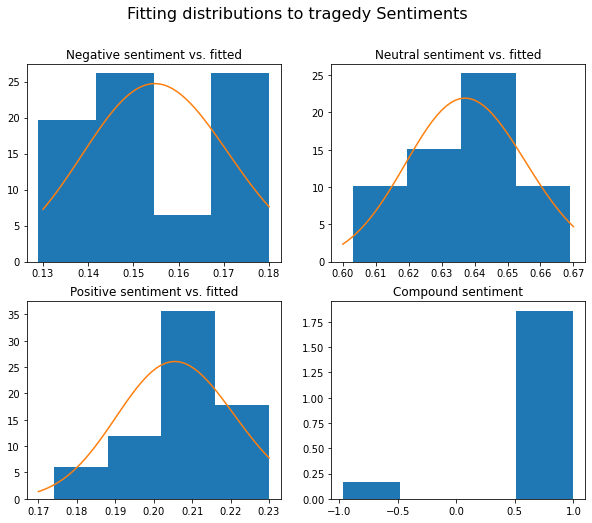

In [44]:
tragedy_neu = df_tragedy_dist['neu']
tragedy_pos = df_tragedy_dist['pos']
tragedy_neg = df_tragedy_dist['neg']
tragedy_compound = df_tragedy_dist['compound']


tragedy_params_neg = gamma.fit(tragedy_neg)
print("Negative model parameters (gamma): ", tragedy_params_neg)
tragedy_model_neg = gamma(*tragedy_params_neg)

tragedy_params_neu = gamma.fit(tragedy_neu)
print("Neutral model parameters (gamma): ", tragedy_params_neu)
tragedy_model_neu = gamma(*tragedy_params_neu)

tragedy_params_pos = gamma.fit(tragedy_pos)
print("Positive model parameters (gamma): ", tragedy_params_pos)
tragedy_model_pos = gamma(*tragedy_params_pos)


# plot the samples and the model to compare

fig, axs = plt.subplots(2, 2, figsize=(10,8))
fig.suptitle("Fitting distributions to tragedy Sentiments", fontsize=16)

axs[0, 0].hist(tragedy_neg, bins=4, density=True)
axs[0, 0].plot(np.linspace(0.13, 0.18), tragedy_model_neg.pdf(np.linspace(0.13, 0.18)))
axs[0, 0].set_title('Negative sentiment vs. fitted')


axs[0, 1].hist(tragedy_neu, bins=4, density=True)
axs[0, 1].plot(np.linspace(0.6, 0.67), tragedy_model_neu.pdf(np.linspace(0.6, 0.67)))
axs[0, 1].set_title('Neutral sentiment vs. fitted')

axs[1, 0].hist(tragedy_pos, bins=4, density=True)
axs[1, 0].plot(np.linspace(0.17, 0.23), tragedy_model_pos.pdf(np.linspace(0.17, 0.23)))
axs[1, 0].set_title('Positive sentiment vs. fitted')

axs[1, 1].hist(tragedy_compound, bins=4, density=True)
axs[1, 1].set_title('Compound sentiment')


plt.show()

### For History

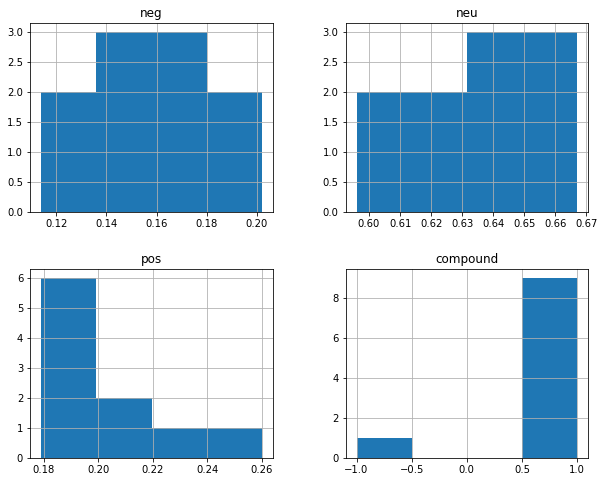

In [45]:
df_history_dist = df_copy[df_copy['genre']=='history'][['neg', 'neu', 'pos', 'compound']]
df_history_dist.hist(bins=4, figsize=(10,8))
plt.show()

Negative model parameters (norm):  (0.15920000000000004, 0.027330568965903367)
Neutral model parameters (gamma):  (241.74545014597334, 0.2766641646313497, 0.0014892601755462833)
Positive model parameters (gamma):  (0.8732347733617654, 0.17899999999999996, 0.026165396604739988)


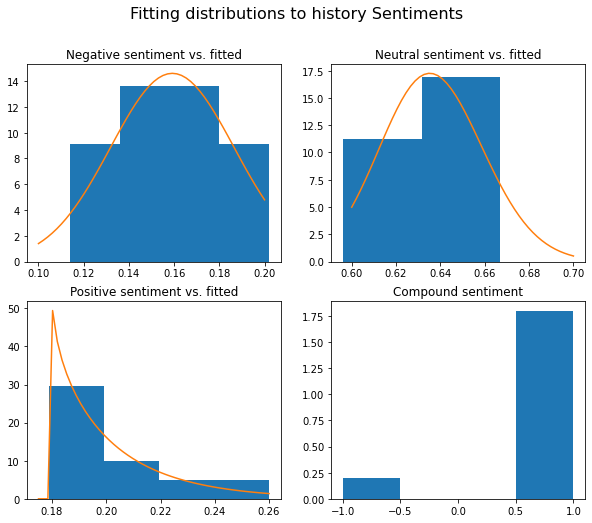

In [46]:
history_neu = df_history_dist['neu']
history_pos = df_history_dist['pos']
history_neg = df_history_dist['neg']
history_compound = df_history_dist['compound']

history_params_neg = norm.fit(history_neg)
print("Negative model parameters (norm): ", history_params_neg)
history_model_neg = norm(*history_params_neg)


history_params_neu = gamma.fit(history_neu)
print("Neutral model parameters (gamma): ", history_params_neu)
history_model_neu = gamma(*history_params_neu)

history_params_pos = gamma.fit(history_pos)
print("Positive model parameters (gamma): ", history_params_pos)
history_model_pos = gamma(*history_params_pos)




# plot the samples and the model to compare

fig, axs = plt.subplots(2, 2, figsize=(10,8))
fig.suptitle("Fitting distributions to history Sentiments", fontsize=16)

axs[0, 0].hist(history_neg, bins=4, density=True)
axs[0, 0].plot(np.linspace(0.1, 0.2), history_model_neg.pdf(np.linspace(0.1, 0.2)))
axs[0, 0].set_title('Negative sentiment vs. fitted')


axs[0, 1].hist(history_neu, bins=4, density=True)
axs[0, 1].plot(np.linspace(0.6, 0.7), history_model_neu.pdf(np.linspace(0.6, 0.7)))
axs[0, 1].set_title('Neutral sentiment vs. fitted')

axs[1, 0].hist(history_pos, bins=4, density=True)
axs[1, 0].plot(np.linspace(0.175, 0.26), history_model_pos.pdf(np.linspace(0.175, 0.26)))
axs[1, 0].set_title('Positive sentiment vs. fitted')

axs[1, 1].hist(history_compound, bins=4, density=True)
axs[1, 1].set_title('Compound sentiment')


plt.show()

# Part 4

#### Time series analysis of sentiments by genre

### For Sonnets

Lets plot the time series for sonnets


#### changed the x axis ticks->identify the sonnet most negative

In [ ]:
df_sonnet_ts = df_copy[df_copy['genre']=='sonnet'][['neg', 'neu', 'pos', 'compound']]
df_sonnet_ts[['neg', 'neu', 'pos']].plot(figsize=(30,15))
plt.xticks(np.arange(0, 154, 5))
plt.legend(prop={'size': 30})
plt.show()

#### smoothing out the time series plot with a rolling window of 10

In [ ]:
df_sonnet_ts_rolling = df_sonnet_ts.rolling(10, min_periods=10).sum()
df_sonnet_ts_rolling[['neg', 'neu', 'pos']].plot(figsize=(30,15))
plt.xticks(np.arange(0, 154, 5))
plt.legend(prop={'size': 30})
plt.show()

### For sonnets we can see an increasing trend in negative sentiment, where as the neutral trend is decrasing. 
### Same with the positive sentiment  

In [ ]:
# todo comedy, tragedy and history